In [2]:
import torch
pret_dir = 'data/fppo/fppo-CartPole_s0/pyt_save/model.pt'
sppo_ac = torch.load(pret_dir)

/home/artur/miniconda3/envs/fsrl/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


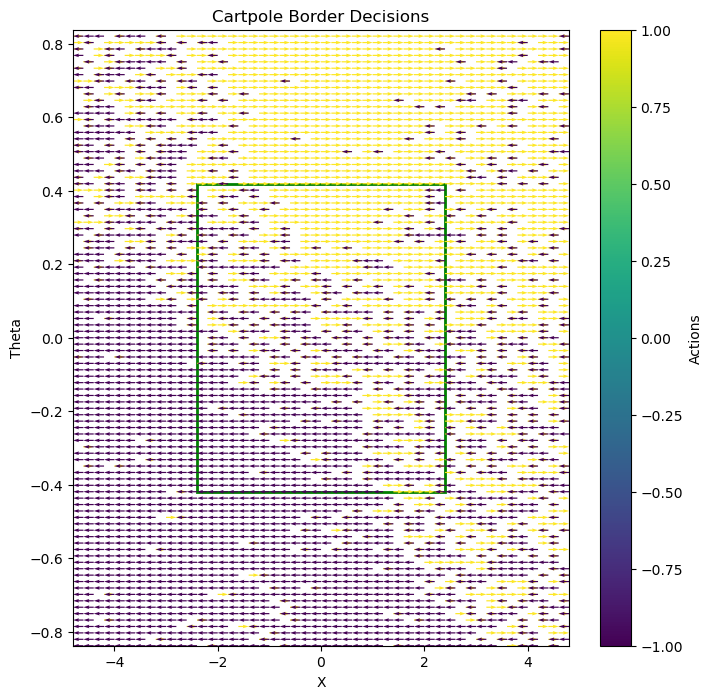

In [ ]:
#Plot positive or negative sampled action for each state
import numpy as np
import math
import matplotlib.pyplot as plt
import matplotlib.patches as patches
ac = sppo_ac
safe_radians = 24 * 2 * math.pi / 360
borders = []
arrowDirX=[]
arrowDirY=[]
safe_x=2.4
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
colors = []
for x in np.arange(-2.4-2.4,2.5+2.4,0.2):
    for theta in np.arange(-safe_radians*2,safe_radians*2,math.pi / 360 *2):
        o=[x,0,theta,0]
        a, a_h, b_h, v, vc, logp_a, logp_b = ac.step(torch.as_tensor(o, dtype=torch.float32))
        borders.append([x,theta])
        threshold = np.clip((b_h/a_h)[0],-1,1)
        if a<=0:
            arrowDirX.append(-5)
            arrowDirY.append(0)
            colors.append(-1)
        else:
            arrowDirX.append(5)
            arrowDirY.append(0)
            colors.append(1)
borders = np.array(borders)
rectangle = patches.Rectangle((-safe_x, -safe_radians), 2*safe_x, 2*safe_radians, linewidth=2, edgecolor='green', facecolor='white')
ax.add_patch(rectangle)
quiver_plot=plt.quiver(borders[:,0], borders[:,1], arrowDirX, arrowDirY,colors, cmap ="viridis", angles='xy', scale_units='xy', scale=25)
# This are the borders of the simulation
plt.axis([-2*safe_x, 2*safe_x, -2*safe_radians, 2*safe_radians])
plt.colorbar(quiver_plot, label="Actions")            
plt.xlabel("X")
plt.ylabel("Theta")
plt.title("Cartpole Border Decisions")
plt.show()

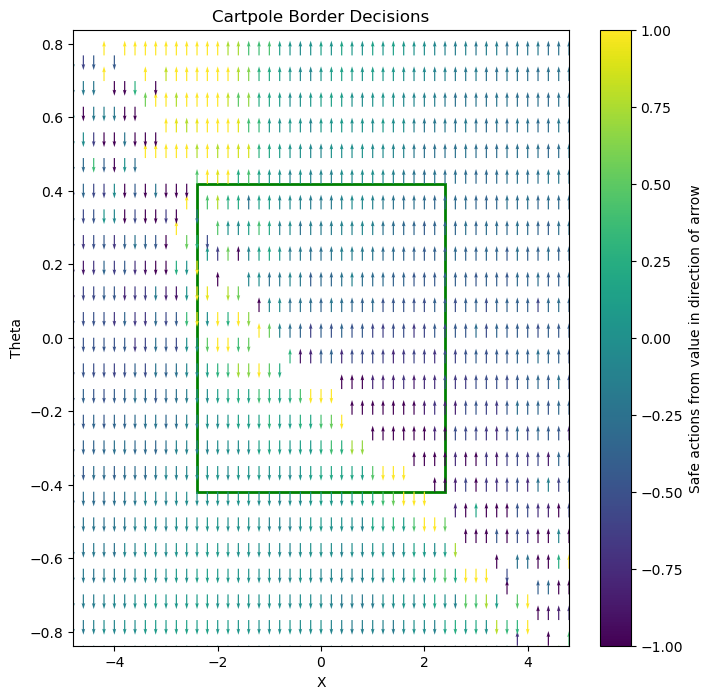

In [3]:
#Plot the hyperplanes in safe direction for all states
import numpy as np
import math
import matplotlib.pyplot as plt
import matplotlib.patches as patches
ac = sppo_ac
safe_radians = 24 * 2 * math.pi / 360
borders = []
arrowDirX=[]
arrowDirY=[]
safe_x=2.4
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
colors = []
for x in np.arange(-2.4-2.4,2.5+2.4,0.2):
    for theta in np.arange(-safe_radians*2,safe_radians*2,math.pi / 360 *8):
        o=[x,0,theta,0]
        a, a_h, b_h, v, vc, logp_a, logp_b = ac.step(torch.as_tensor(o, dtype=torch.float32))
        borders.append([x,theta])
        threshold = np.clip((b_h/a_h)[0],-1,1)
        if(a_h>0):
            to_right_is_dangerous = False
        else:
            to_right_is_dangerous = True
        if to_right_is_dangerous:
            arrowDirX.append(0)
            arrowDirY.append(-1)
            colors.append(threshold)
        else:
            arrowDirX.append(0)
            arrowDirY.append(1)
            colors.append(threshold)
borders = np.array(borders)
rectangle = patches.Rectangle((-safe_x, -safe_radians), 2*safe_x, 2*safe_radians, linewidth=2, edgecolor='green', facecolor='white')
ax.add_patch(rectangle)
quiver_plot=plt.quiver(borders[:,0], borders[:,1], arrowDirX, arrowDirY,colors, cmap ="viridis", angles='xy', scale_units='xy', scale=25)
# This are the borders of the simulation
plt.axis([-2*safe_x, 2*safe_x, -2*safe_radians, 2*safe_radians])
plt.colorbar(quiver_plot, label="Safe actions from value in direction of arrow")            
plt.xlabel("X")
plt.ylabel("Theta")
plt.title("Cartpole Border Decisions")
plt.show()

In [ ]:
#Run from good starting point and rende
from envs.cartpole_pret import Cartpole
import time
import numpy as np
env = Cartpole(0, 0, focus=0)
ac = sppo_ac
o = env.reset([2,0,-0.4,0])
action_sequence=[-0.2]*5 + [-1]*0 + [1]*100
for step in range(100):
    env.render()
    a, a_h, b_h, v, vc, logp_a, logp_b = ac.stepEval(torch.as_tensor(o, dtype=torch.float32))
    #print(f"Action:{a}")
    #print(f"Obs:{o[2]}")
    #print(step)
    #next_o, r, d, info = env.step(np.array([action_sequence[step]], dtype=np.float32))
    next_o, r, d, info = env.step(a)
    o = next_o
    time.sleep(0.4)

In [ ]:
#Start from probably bad position and render
from envs.cartpole_pret import Cartpole
import time
import numpy as np
env = Cartpole(0, 0, focus=0)
ac = sppo_ac
o = env.reset([2,0,-0.4,0])
for step in range(100):
    env.render()
    a, a_h, b_h, v, vc, logp_a, logp_b = ac.stepEval(torch.as_tensor(o, dtype=torch.float32))
    #print(f"Action:{a}")
    #print(f"Obs:{o[2]}")
    #print(step)
    threshold = np.clip((b_h/a_h)[0],-1,1)
    if(a_h>0):
        to_right_is_dangerous = False
    else:
        to_right_is_dangerous = True
    if to_right_is_dangerous:
        print(f"Limits: -1 - {threshold}, Action: {a}")
    else:
        print(f"Limits: {threshold} - 1, Action: {a}")
    next_o, r, d, info = env.step(np.array([action_sequence[step]], dtype=np.float32))
    print(a)
    print(o)
    o = next_o
    time.sleep(2)

/home/artur/miniconda3/envs/fsrl/lib/python3.8/site-packages/gym/spaces/box.py:73: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(


-3.5999999999999996
-0.6283185307179586
[-0.2048248]
[-3.6         0.         -0.62831853  0.        ]
[-0.870686]
[-3.6        -0.11028957 -0.62831853 -0.03896966]
-3.5999999999999996
-0.4886921905584123
[-9.207012]
[-3.6         0.         -0.48869219  0.        ]
[-2.7397816]
[-3.6        -0.57022498 -0.48869219  0.61719352]
-3.5999999999999996
-0.34906585039886595
[-4.691672]
[-3.6         0.         -0.34906585  0.        ]
[-2.317665]
[-3.6        -0.57582788 -0.34906585  0.7110979 ]
-3.5999999999999996
-0.20943951023931962
[-0.9294283]
[-3.6         0.         -0.20943951  0.        ]
[-0.858182]
[-3.6        -0.53943277 -0.20943951  0.73034127]
-3.5999999999999996
-0.06981317007977328
[-0.52589923]
[-3.6         0.         -0.06981317  0.        ]
[-0.8158693]
[-3.6        -0.30673627 -0.06981317  0.43847521]
-3.5999999999999996
0.06981317007977306
[-0.66712844]
[-3.6         0.          0.06981317  0.        ]
[-0.46433976]
[-3.6        -0.39137284  0.06981317  0.60613761]
-3.

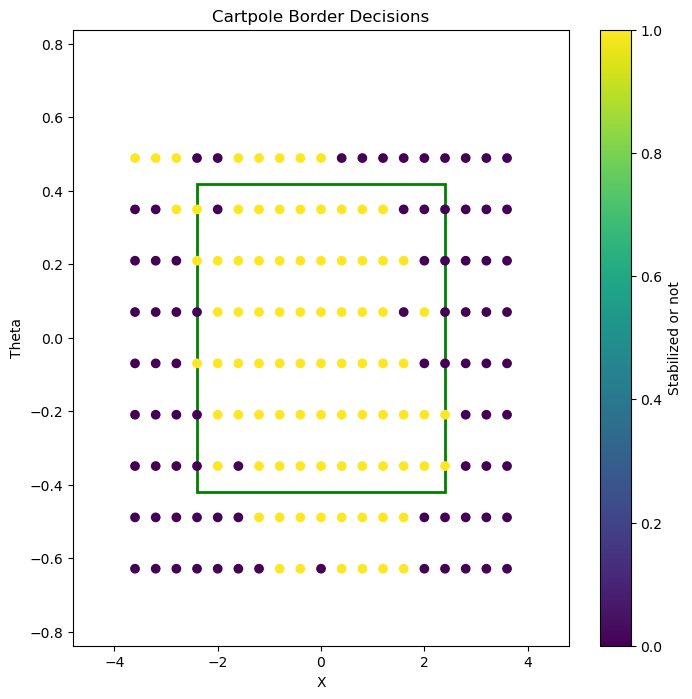

In [66]:
# Test from where it can stabilize and plot it
from envs.cartpole_pret import Cartpole
import time
import numpy as np
env = Cartpole(0, 0, focus=0)
ac = sppo_ac
borders=[]
colors=[]
for x in np.arange(-2.4-1.2,2.5+1.2,0.4):
    for theta in np.arange(-safe_radians*1.5,safe_radians*1.5,math.pi / 360 *16):
        print(x)
        print(theta)
        o = env.reset([x,0,theta,0])
        steps = 0
        done = False
        while not done and steps <=1000:
            a, a_h, b_h, v, vc, logp_a, logp_b = ac.stepEval(torch.as_tensor(o, dtype=torch.float32))
            threshold = np.clip((b_h/a_h)[0],-1,1)
            next_o, r, d, info = env.step(a)
            done = d
            steps +=1
            print(a)
            print(o)
            o = next_o
        borders.append([x,theta])
        if done: 
            colors.append(0)
        else:
            colors.append(1)
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
borders = np.array(borders)
safe_x = 2.4
safe_radians = 24 * 2 * math.pi / 360
rectangle = patches.Rectangle((-safe_x, -safe_radians), 2*safe_x, 2*safe_radians, linewidth=2, edgecolor='green', facecolor='white')
ax.add_patch(rectangle)
scatter_plot=plt.scatter(borders[:,0], borders[:,1],c= colors, cmap="viridis")
# This are the borders of the simulation
plt.axis([-2*safe_x, 2*safe_x, -2*safe_radians, 2*safe_radians])
plt.colorbar(scatter_plot, label="Stabilized or not")            
plt.xlabel("X")
plt.ylabel("Theta")
plt.title("Cartpole Border Decisions")
plt.show()  # Close plot to avoid replotting issues


[[0.04128124418642645, -0.03715219980960745, False, 0.67203337], [0.04091685542486476, -0.037312822869812634, False, 0.5798801], [0.04301703326634898, -0.041386149456349705, False, 0.4020013], [0.04602937048898665, -0.047046111254251434, True, -0.8361823], [0.03805246756881313, -0.036479608806878554, True, -0.19293492], [0.023908391443530776, -0.016949111285447474, True, -0.2339091], [0.010562679230094017, 0.0011701845758450014, True, -0.48539984], [0.0018931552589219816, 0.012176549551596827, True, -0.21228129], [-0.013403414878627437, 0.033130357654681655, True, -0.08413368], [-0.03270168954120399, 0.0601578738982705, True, -0.26353434], [-0.05281118183211314, 0.08859631970624884, True, -0.16194214], [-0.0693946899186256, 0.11210887162628355, True, 0.017645817], [-0.08404780075688983, 0.13325744957008473, True, -0.16859905], [-0.09123340838000894, 0.14393291010164655, True, -0.15172057], [-0.09275692450455053, 0.14697176737015236, True, -0.48502156], [-0.08500018919705256, 0.13707759

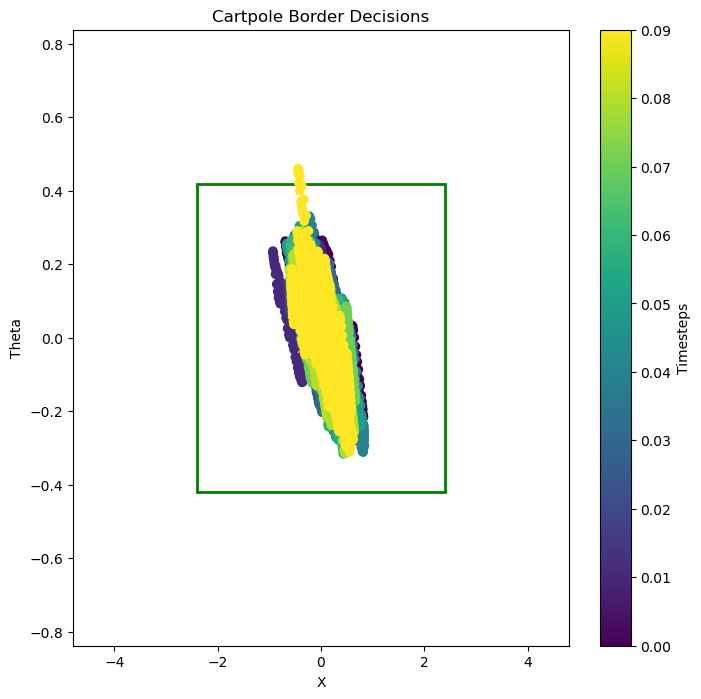

In [ ]:
#Scatter run good from 0,0 trajectories
from envs.cartpole_pret import Cartpole
import time
import numpy as np
env = Cartpole(0, 0, focus=0)
ac = sppo_ac
evalIters=10
borders = []
colors = []
for i in range(evalIters):
    d = False
    steps = 0
    o = env.reset()
    while(not (d or (steps%4000==0 and steps != 0)) ):
        a, a_h, b_h, v, vc, logp_a, logp_b = ac.stepEval(torch.as_tensor(o, dtype=torch.float32))
        next_o, r, d, info = env.step(a)
        steps +=1
        if(a_h>0):
            to_right_is_dangerous = True
        else:
            to_right_is_dangerous = False
        threshold = (b_h/a_h)[0]
        borders.append([o[0],o[2],to_right_is_dangerous, threshold])
        colors.append(i/100)
        o = next_o
print(borders)
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
borders = np.array(borders)
safe_x = 2.4
safe_radians = 24 * 2 * math.pi / 360
rectangle = patches.Rectangle((-safe_x, -safe_radians), 2*safe_x, 2*safe_radians, linewidth=2, edgecolor='green', facecolor='white')
ax.add_patch(rectangle)
scatter_plot=plt.scatter(borders[:,0], borders[:,1],c= colors, cmap="viridis")
# This are the borders of the simulation
plt.axis([-2*safe_x, 2*safe_x, -2*safe_radians, 2*safe_radians])
plt.colorbar(scatter_plot, label="Timesteps")            
plt.xlabel("X")
plt.ylabel("Theta")
plt.title("Cartpole Border Decisions")
plt.show()  # Close plot to avoid replotting issues